## Notebook Purpose
This notebook is used to plot high-resolution zoomed-in SMB maps over sections of Imja Lhotse Shar Glacier (Figure 6 A/B).

#### Last updated: May 23, 2023

## TODO:
- Update imports when new library has been built up with all updates
-Generalise path to data products during revisions, after the data distribution plan is finalized

In [1]:
%load_ext autoreload
%autoreload 2
%config InlineBackend.figure_format='retina'


In [2]:
import numpy as np 
import geopandas as gpd
import matplotlib.pyplot as plt
from imview import pltlib
import pandas as pd
from pygeotools.lib import warplib,geolib,iolib,malib,filtlib,timelib
import os,sys,glob,shutil
from skimage import exposure
from debris_cover_smb import glac_dyn, constants, geospatial
import warnings
warnings.filterwarnings('ignore')

In [3]:
%matplotlib inline

In [4]:
%cd /nobackup/sbhusha1/chapter2/HighresDebrisCover_SMB_Data/ImjaLhotseShar/

/nobackupp11/sbhusha1/chapter2/HighresDebrisCover_SMB_Data/ImjaLhotseShar


In [11]:

euldz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif'
lagdz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_lagrangian_dhdt.tif'
downslope_dz_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_downslope_dhdt.tif'
smb_fn = 'SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_smb_dhdt.tif'
dem1_fn = 'dem/20151002_0651_10200100457F0C00_1020010042C0CE00-DEM_2m_align.tif'
ortho_img1 = 'orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif'
ortho_img2 = 'orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif'
vx_fn = 'SMB_data/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vx_skiprate_1_gauss_fill51px_shpclip.tif'
vy_fn = 'SMB_data/20151002_combined_hs_masked__20161029_combined_hs_masked_mgm_disp_9spm_spm_ker15_corr_kernel9px_resmin_txm_vy_skiprate_1_gauss_fill51px_shpclip.tif'

In [6]:
%matplotlib widget

In [14]:
ds = iolib.fn_getds(smb_fn)
ma = iolib.ds_getma(ds)
ds_extent = geolib.ds_extent(ds)
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]


<Axes: >

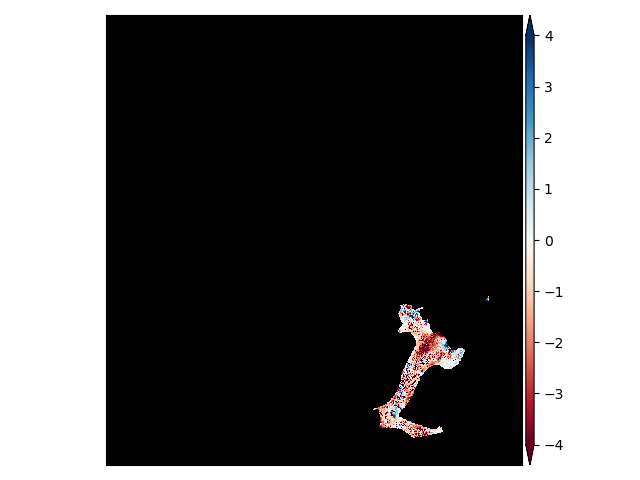

In [15]:
f,ax = plt.subplots()
pltlib.iv(ma,ax=ax,cmap='RdBu',clim=(-4,4),extent=fig_extent)



In [8]:
xlim = (494654.0550696297, 495028.26946962974)
ylim = (3087071.645232197, 3087558.717943308)



In [6]:
ice_cliff_gpkg = gpd.read_file('SMB_data/imja_icecliff_final_location.gpkg')

In [19]:
## New area for sub-part b

In [9]:
low_res_extent = [494654.0550696297+20, 3087071.645232197, 495028.26946962974, 3087558.717943308]
ds_extent = low_res_extent
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [12]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn([ortho_img1,
                                                 ortho_img2],extent=low_res_extent)
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
#low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn,vx_fn,vy_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1,vx,vy = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [494674.0550696297, 3087071.645232197, 495028.26946962974, 3087558.717943308]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif
nl: 955 ns: 695 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 2: orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif
nl: 955 ns: 695 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...
Warping all inputs to the following:
Resolution: 2.0
Extent: [494674.0550696297, 3087071.645232197, 495028.26946962974, 3087558.717943308]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 7: SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 244 ns: 177 res: 2.000
100 - done.
0...10...20...30...40...5

In [13]:
def norm(a, perc_lim=(2, 98), clip=True, verbose=True):
    # Written and shared by David
    #Simple approach using actual min and max values
    #amin, amax = (a.min(), a.max())
    #Check if we're using masked array or np.nan
    if np.ma.isMaskedArray(a):
        amin, amax = np.percentile(a.compressed(), perc_lim)
    else:
        amin, amax = np.nanpercentile(a, perc_lim)
    out = ((a - amin)/(amax - amin))
    #This will "clip" normalized values <0 to 0 and >1 to 1
    if clip:
        out = out.clip(0,1)
    if verbose:
        print("Input range: ({}, {})".format(a.min(), a.max()))
        print(f"Percentile range {perc_lim}: ({amin}, {amax})")
        print("Output range: ({}, {})".format(out.min(), out.max()))
    return out

In [20]:
%matplotlib inline

In [27]:
def compute_bearing_from_N(vx,vy):
    # Compute bearing of velocity
    direction_vector = np.rad2deg(np.arctan2(vx,vy))
    # correct bearing for third and fourth quadrant
    neg_idx = direction_vector < 0
    direction_vector[neg_idx] = direction_vector[neg_idx] + 360
    # this should be the bearing from North increasing in the clockwise direction
    return direction_vector

In [31]:
direction_vector = np.ma.median(compute_bearing_from_N(vx,vy))

In [35]:
direction_vector

205.3330078125

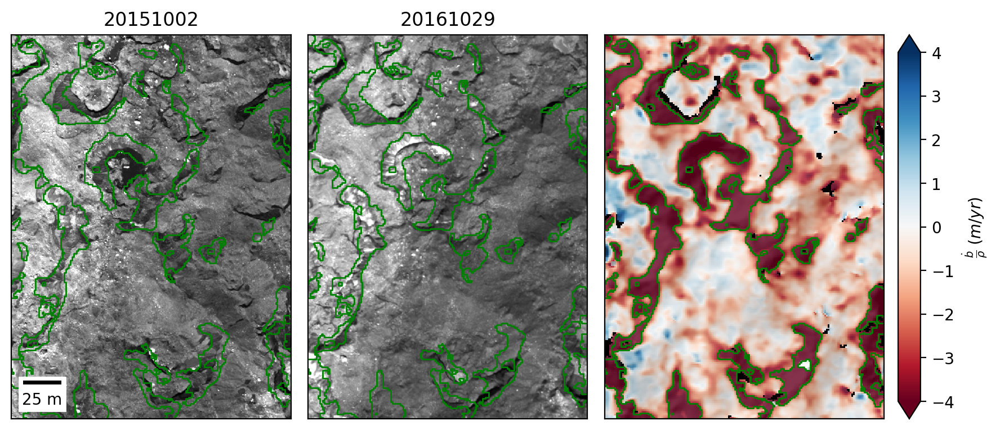

In [33]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',extent=fig_extent,clim=malib.calcperc(cliff2_t1,(0.01,99.5)))
pltlib.add_scalebar(ax=ax[0],res=geolib.get_res(ds_list_ortho_cliff2[0])[0],location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',extent=fig_extent,clim=malib.calcperc(cliff2_t2,(0.01,99.5)))
pltlib.iv(smb,ds=low_res_ds_list[-3],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
ice_cliff_gpkg.plot(ax=ax[0],facecolor='None',edgecolor='green',linewidth=1)
ice_cliff_gpkg.plot(ax=ax[1],facecolor='None',edgecolor='green',linewidth=1)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ax[1].set_xlim(fig_extent[0],fig_extent[1])
ax[1].set_ylim(fig_extent[2],fig_extent[3])
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_small_with_cliffs_newpartb.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

In [43]:
cp ../../figures/imja_zoomin_3panel1_full_res_small_with_cliffs_newpartb.png /nobackup/sbhusha1/notebooks/GlacierDynamics/

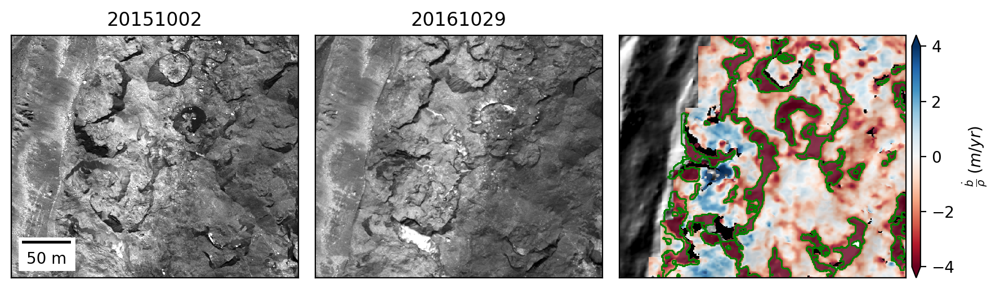

In [49]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',extent=fig_extent,clim=malib.calcperc(cliff2_t1,(0.01,99.5)))
pltlib.add_scalebar(ax=ax[0],res=geolib.get_res(ds_list_ortho_cliff2[0])[0],location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',extent=fig_extent,clim=malib.calcperc(cliff2_t2,(0.01,99.5)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
plt.tight_layout()
#f.savefig('../../figures/imja_zoomin_3panel1_full_res_small_with_cliffs_newpartb.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## old sub-part b

In [6]:
low_res_extent = [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
ds_extent = low_res_extent
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [7]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn([ortho_img1,
                                                 ortho_img2],extent=low_res_extent)
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
#low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn],extent=low_res_extent)
euldz,lagdz,downslope_dz,smb,dem1 = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif
nl: 852 ns: 781 res: 0.510
0...10...20...30...40...50...60...70...80...90...2 of 2: orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif
nl: 852 ns: 781 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...
Warping all inputs to the following:
Resolution: 2.0
Extent: [494341.49186541745, 3086217.7732606973, 494739.80186541745, 3086652.2932606973]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 5: SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 217 ns: 199 res: 2.000
100 - done.
0...10...20...30...40...50...60

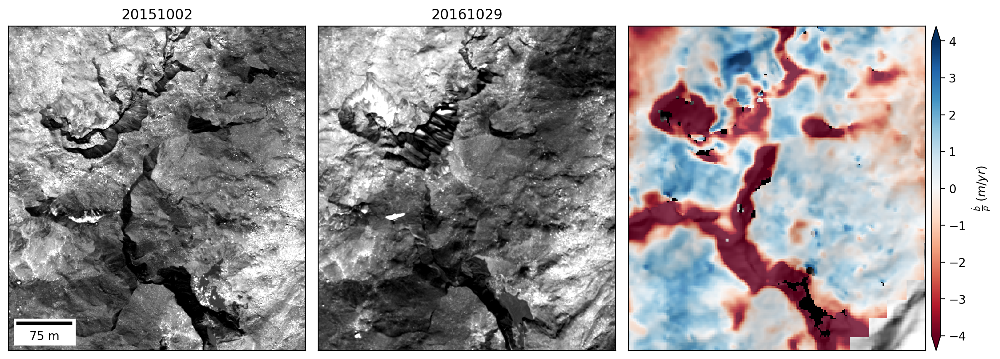

In [9]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

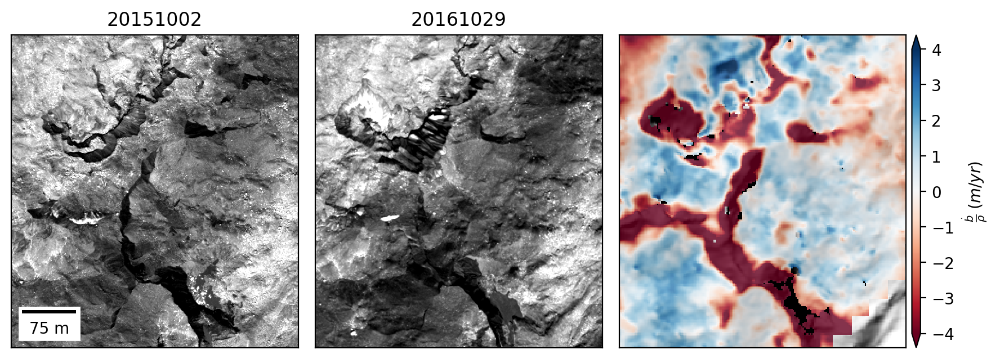

In [11]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002')
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029')
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

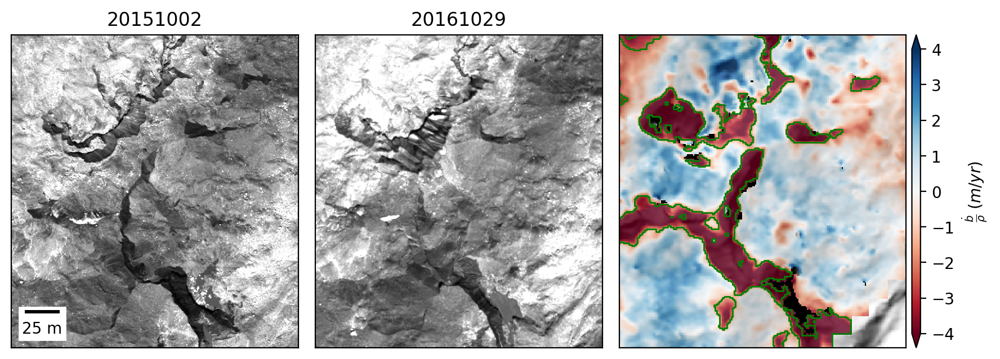

In [14]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)),extent=fig_extent)
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)),extent=fig_extent)
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_small_with_cliffs.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

## Upper Area

In [36]:
low_res_extent = [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
ds_extent = low_res_extent
fig_extent = [ds_extent[0],ds_extent[2],ds_extent[1],ds_extent[3]]

In [37]:
#ds_list_ortho_cliff2 = warplib.memwarp_multi_fn(['20151002_10200100457F0C00_ortho_proc/20151002_10200100457F0C00_ortho_res_0.51m_upper_area_clip_zoom_trim.tif',
#                                                 '20161029_103001005E3EFF00_ortho_proc/20161029_103001005E3EFF00_ortho_res_0.53m_upper_area_clip_shifted_zoom_trim.tif'])
ds_list_ortho_cliff2 = warplib.memwarp_multi_fn([ortho_img1,
                                                 ortho_img2],extent=low_res_extent)
cliff2_t1,cliff2_t2 = [iolib.ds_getma(ds) for ds in ds_list_ortho_cliff2]
#low_res_extent = geolib.ds_extent(ds_list_ortho_cliff2[0])
debris_thick_fn = constants.fetch_rounce_debris_thickness('imja')
low_res_ds_list = warplib.memwarp_multi_fn([euldz_fn,lagdz_fn,downslope_dz_fn,smb_fn,dem1_fn,debris_thick_fn,vx_fn,vy_fn],extent=low_res_extent)

euldz,lagdz,downslope_dz,smb,dem1,deb_thick,vx,vy = [iolib.ds_getma(ds) for ds in low_res_ds_list]


Warping all inputs to the following:
Resolution: 0.51
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 2: orthoimage/aligned_images/20151002_10200100457F0C00_ortho_res_0.51m.tif
nl: 2264 ns: 1860 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...2 of 2: orthoimage/aligned_images/20161029_103001005E3EFF00_ortho_res_0.53m__shifted_to__20151002_10200100457F0C00_ortho_res_0.51m_flow_corrected.tif
nl: 2264 ns: 1860 res: 0.510
100 - done.
0...10...20...30...40...50...60...70...80...90...
Warping all inputs to the following:
Resolution: 2.0
Extent: [495173.96539915726, 3087798.963492993, 496122.56539915723, 3088953.603492993]
Projection: '+proj=utm +zone=45 +datum=WGS84 +units=m +no_defs'
Resampling alg: cubic

1 of 8: SMB_data/imja_farinotti_2015-10-02_to_2016-10-29_eulerian_dhdt.tif
nl: 577 ns: 474 res: 2.000
100 - done.
0...10...20...30...

In [44]:
malib.calcperc(cliff2_t1)

(0.08147532492876053, 0.6096022725105286)

In [45]:
malib.calcperc(cliff2_t2)

(0.19307621873915196, 1.4028712267875707)

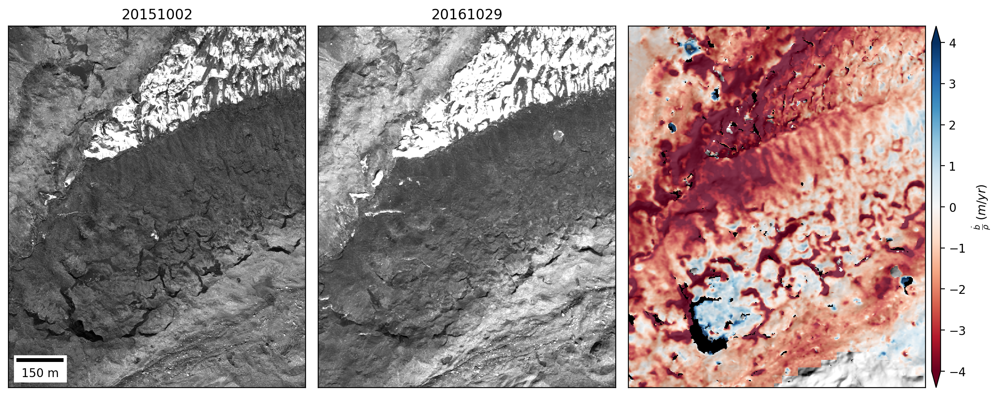

In [46]:
f,ax = plt.subplots(1,3,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
#f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

In [10]:
%matplotlib widget

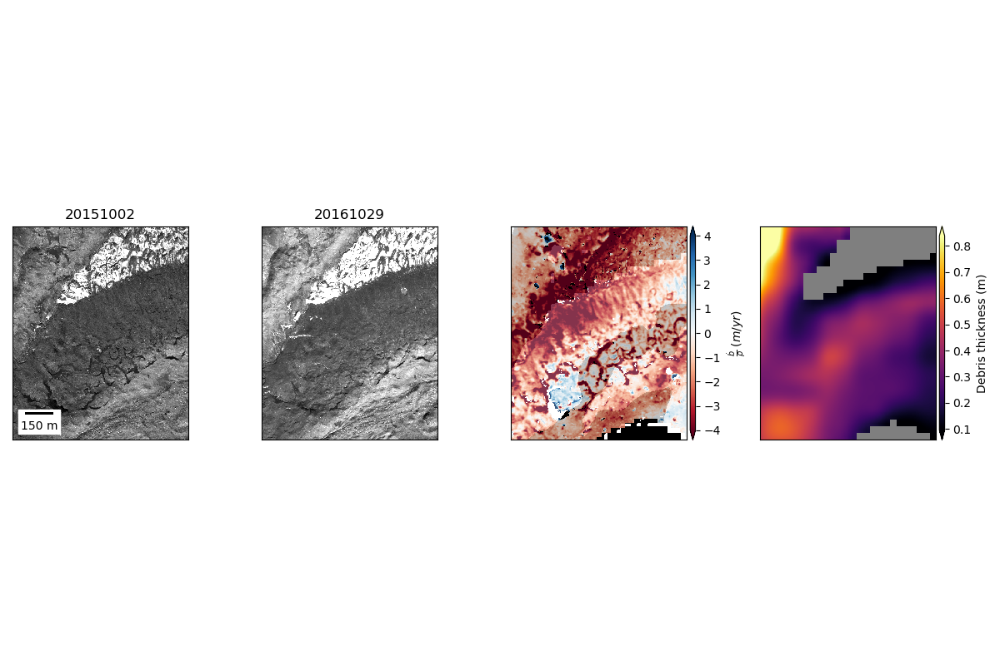

In [11]:
f,ax = plt.subplots(1,4,figsize=(12,8))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
pltlib.iv(deb_thick,ax=ax[3],cmap='inferno',skinny=False,label='Debris thickness (m)')
plt.tight_layout()

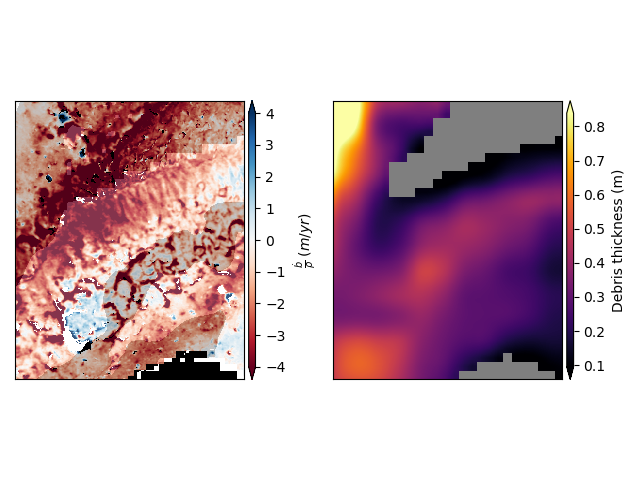

In [12]:
f,ax = plt.subplots(1,2,sharex=True,sharey=True)
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[0],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
pltlib.iv(deb_thick,ax=ax[1],cmap='inferno',skinny=False,label='Debris thickness (m)')
plt.tight_layout()

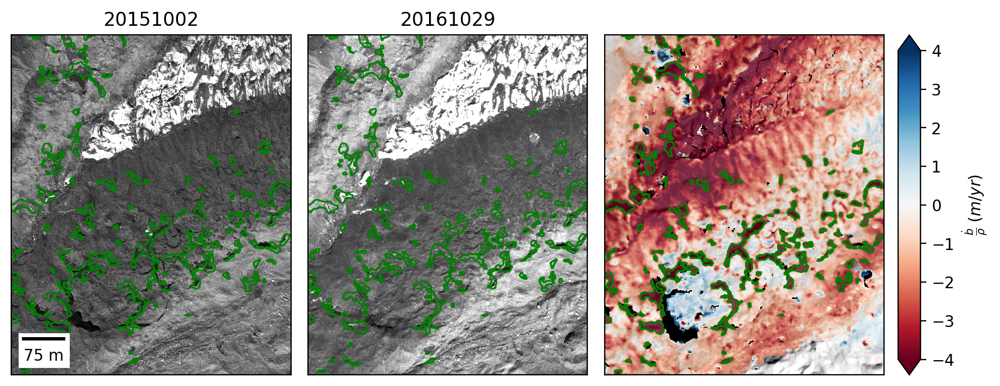

In [39]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)),extent=fig_extent)
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower left')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)),extent=fig_extent)
pltlib.iv(smb,ds=low_res_ds_list[-4],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$',extent=fig_extent)
ax[2].set_xlim(fig_extent[0],fig_extent[1])
ax[2].set_ylim(fig_extent[2],fig_extent[3])
ax[0].set_xlim(fig_extent[0],fig_extent[1])
ax[0].set_ylim(fig_extent[2],fig_extent[3])
ax[1].set_xlim(fig_extent[0],fig_extent[1])
ax[1].set_ylim(fig_extent[2],fig_extent[3])
ice_cliff_gpkg.plot(ax=ax[2],facecolor='None',edgecolor='green',linewidth=1)
ice_cliff_gpkg.plot(ax=ax[1],facecolor='None',edgecolor='green',linewidth=1)
ice_cliff_gpkg.plot(ax=ax[0],facecolor='None',edgecolor='green',linewidth=1)
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small_with_cliffs.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

In [40]:
direction_vector = np.ma.median(compute_bearing_from_N(vx,vy))

In [41]:
direction_vector

243.55630493164062

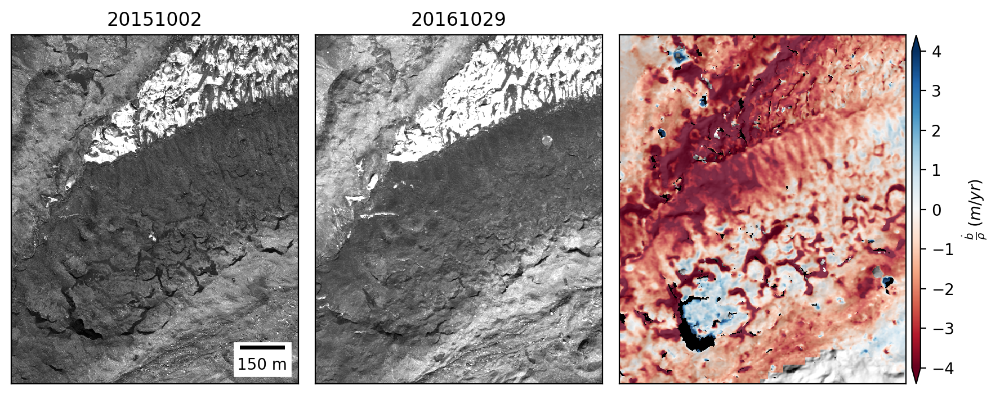

In [47]:
f,ax = plt.subplots(1,3,figsize=(9,4))
pltlib.iv(cliff2_t1,ax=ax[0],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20151002',
          clim=malib.calcperc(cliff2_t1,(0.01,97)))
pltlib.add_scalebar(ax=ax[0],res=0.51,location='lower right')
pltlib.iv(cliff2_t2,ax=ax[1],cmap='gray',scalebar=False,skinny=False,cbar=False,title='20161029',
          clim=malib.calcperc(cliff2_t2,(0.001,92)))
pltlib.iv(smb,ds=low_res_ds_list[-1],hillshade=True,scalebar=False,full_bg_stretch=True,overlay_alpha=0.8,
          ax=ax[2],cmap='RdBu',clim=(-4,4),skinny=False,label=r'$\frac{\dot{b}}{\rho}\;(m/yr)$')
plt.tight_layout()
f.savefig('../../figures/imja_zoomin_3panel1_full_res_upper_area_small.png',dpi=300,bbox_inches='tight',pad_inches=0.1)

In [48]:
pwd

'/nobackupp11/sbhusha1/chapter2/imja/20230223'